In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Importing preprocessed training and validation data

In [ ]:
import numpy as np

BASE_DIR = "/content/drive/MyDrive/Satellite_Property_Valuation"

# Load tabular features
X_train_tab = np.load(f"{BASE_DIR}/processed/tabular/X_train.npy")
X_val_tab   = np.load(f"{BASE_DIR}/processed/tabular/X_val.npy")

# Load log-transformed targets
y_train_log = np.load(f"{BASE_DIR}/processed/targets/y_train_log.npy")
y_val_log   = np.load(f"{BASE_DIR}/processed/targets/y_val_log.npy")


print("Train shape:", X_train_tab.shape, y_train_log.shape)
print("Val shape:  ", X_val_tab.shape, y_val_log.shape)

Train shape: (12967, 17) (12967,)
Val shape:   (3242, 17) (3242,)


# ML MODELS

# Model 1: XGB REGRESSOR

In [ ]:
from xgboost import XGBRegressor
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
import numpy as np

In [ ]:
xgb = XGBRegressor(
    n_estimators=200,
    learning_rate=0.1,
    max_depth=6,
    random_state=42
)

xgb.fit(X_train_tab, y_train_log)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             feature_weights=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=0.1, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=6,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=200,
             n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred_log = xgb.predict(X_val_tab)

y_pred = np.expm1(y_pred_log)
y_val = np.expm1(y_val_log)

In [ ]:
mae = mean_absolute_error(y_val, y_pred)
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
r2 = r2_score(y_val, y_pred)

print("MAE :", mae)
print("RMSE:", rmse)
print("R²  :", r2)

MAE : 67308.42294012186
RMSE: 120356.46955255698
R²  : 0.8845657806836225


In [ ]:
# XGBoost model was trained with standard hyperparameters to establish a reference performance before tuning.

In [ ]:
# now we will perform hyperparameter tuning

xgb = XGBRegressor(
    objective="reg:squarederror",
    random_state=42
)

In [ ]:
param_dist = {
    "n_estimators": [300, 500, 700, 900],
    "learning_rate": [0.01, 0.03, 0.05, 0.1],
    "max_depth": [4, 5, 6, 7],
    "subsample": [0.7, 0.8, 0.9],
    "colsample_bytree": [0.7, 0.8, 0.9],
    "reg_alpha": [0, 0.01, 0.1, 1.0],     # L1
    "reg_lambda": [0.5, 1.0, 2.0, 5.0]    # L2
}


In [ ]:
xgb_random = RandomizedSearchCV(
    estimator=xgb,
    param_distributions=param_dist,
    n_iter=40,
    scoring="r2",
    cv=5,
    verbose=1,
    random_state=42,
    n_jobs=-1
)


In [ ]:
xgb_random.fit(X_train_tab, y_train_log, verbose=1)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


RandomizedSearchCV(cv=5,
                   estimator=XGBRegressor(base_score=None, booster=None,
                                          callbacks=None,
                                          colsample_bylevel=None,
                                          colsample_bynode=None,
                                          colsample_bytree=None, device=None,
                                          early_stopping_rounds=None,
                                          enable_categorical=False,
                                          eval_metric=None, feature_types=None,
                                          feature_weights=None, gamma=None,
                                          grow_policy=None,
                                          importance_type=None,
                                          interaction_constraint...
                                          n_estimators=None, n_jobs=None,
                                          num_parallel_tree=None, ...),
                   n_iter=40, n_jobs=-1,
                   param_distributions={'colsample_bytree': [0.7, 0.8, 0.9],
                                        'learning_rate': [0.01, 0.03, 0.05,
                                                          0.1],
                                        'max_depth': [4, 5, 6, 7],
                                        'n_estimators': [300, 500, 700, 900],
                                        'reg_alpha': [0, 0.01, 0.1, 1.0],
                                        'reg_lambda': [0.5, 1.0, 2.0, 5.0],
                                        'subsample': [0.7, 0.8, 0.9]},
                   random_state=42, scoring='r2', verbose=1)

In [ ]:
xgb_random.best_params_

{'subsample': 0.8,
 'reg_lambda': 2.0,
 'reg_alpha': 1.0,
 'n_estimators': 700,
 'max_depth': 7,
 'learning_rate': 0.03,
 'colsample_bytree': 0.8}

In [ ]:
best_xgb = xgb_random.best_estimator_

y_pred_log = best_xgb.predict(X_val_tab)

y_pred = np.expm1(y_pred_log)
y_val = np.expm1(y_val_log)

In [ ]:
mae = mean_absolute_error(y_val, y_pred)
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
r2 = r2_score(y_val, y_pred)

print("MAE :", mae)
print("RMSE:", rmse)
print("R²  :", r2)

MAE : 65210.34489223475
RMSE: 115149.75946555087
R²  : 0.8943372862827625


# Model 2: Catboost regressor

In [ ]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 8.0 MB/s eta 0:00:00


In [ ]:
from catboost import CatBoostRegressor

In [ ]:
cat = CatBoostRegressor(
    iterations=600,
    learning_rate=0.05,
    depth=6,
    l2_leaf_reg=3.0,
    loss_function="RMSE",
    random_seed=42,
    verbose=False
)

cat.fit(X_train_tab, y_train_log)

In [ ]:
y_pred_log = cat.predict(X_val_tab)

y_pred = np.expm1(y_pred_log)
y_val = np.expm1(y_val_log)

In [ ]:
mae = mean_absolute_error(y_val, y_pred)
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
r2 = r2_score(y_val, y_pred)

print("MAE :", mae)
print("RMSE:", rmse)
print("R²  :", r2)

/bin/bash: -c: line 1: syntax error near unexpected token `('
/bin/bash: -c: line 1: `mae = mean_absolute_error(y_val, y_pred)'
MAE : 65210.34489223475
RMSE: 113847.75166366337
R²  : 0.8967132512837986


In [ ]:
# now we will perform hyperparameter tuning
param_dist = {
    "iterations": [400, 600, 800],
    "learning_rate": [0.03, 0.05, 0.1],
    "depth": [4, 5, 6, 7],
    "l2_leaf_reg": [1, 3, 5, 7, 9],
    "bagging_temperature": [0, 1, 3, 5]
}

In [ ]:
cat = CatBoostRegressor(
    loss_function="RMSE",
    random_seed=42,
    verbose=False
)

cat_random = RandomizedSearchCV(
    estimator=cat,
    param_distributions=param_dist,
    n_iter=40,
    scoring="r2",
    cv=5,
    random_state=42,
    n_jobs=-1,
    verbose=1
)

In [ ]:
cat_random.fit(X_train_tab, y_train_log)


Fitting 5 folds for each of 40 candidates, totalling 200 fits


RandomizedSearchCV(cv=5,
                   estimator=<catboost.core.CatBoostRegressor object at 0x7f9a0e4dac60>,
                   n_iter=40, n_jobs=-1,
                   param_distributions={'bagging_temperature': [0, 1, 3, 5],
                                        'depth': [4, 5, 6, 7],
                                        'iterations': [400, 600, 800],
                                        'l2_leaf_reg': [1, 3, 5, 7, 9],
                                        'learning_rate': [0.03, 0.05, 0.1]},
                   random_state=42, scoring='r2', verbose=1)

In [ ]:
cat_random.best_params_

{'learning_rate': 0.05,
 'l2_leaf_reg': 1,
 'iterations': 800,
 'depth': 7,
 'bagging_temperature': 5}

In [ ]:
best_cat = cat_random.best_estimator_

y_pred_log = best_cat.predict(X_val_tab)

y_pred = np.expm1(y_pred_log)
y_val = np.expm1(y_val_log)

In [ ]:
mae = mean_absolute_error(y_val, y_pred)
rmse = np.sqrt(mean_squared_error(y_val, y_pred))
r2 = r2_score(y_val, y_pred)

print("MAE :", mae)
print("RMSE:", rmse)
print("R²  :", r2)

MAE : 64571.74921699231
RMSE: 114044.97567142629
R²  : 0.8963550839814645


 # NEURAL NETWORK

# Model 3

In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers, callbacks
import os

# Define the paths you provided
BASE_PATH = "/content/drive/MyDrive/Satellite_Property_Valuation/processed"

def load_data():
    """
    Loads the numpy arrays using your specific naming convention (X_val, y_train_log, etc.)
    """
    print("Loading datasets")

    # --- TRAIN DATA ---
    X_z16_train = np.load(os.path.join(BASE_PATH, "image_z16/X_train.npy"))
    X_z17_train = np.load(os.path.join(BASE_PATH, "image_z17/X_train.npy"))
    X_z18_train = np.load(os.path.join(BASE_PATH, "image_z18/X_train.npy"))
    X_tab_train = np.load(os.path.join(BASE_PATH, "tabular/X_train.npy"))
    y_train_log = np.load(os.path.join(BASE_PATH, "targets/y_train_log.npy")) # Uses your log target

    # --- VALIDATION DATA ---
    # You named these X_val instead of X_test in your folders
    X_z16_val = np.load(os.path.join(BASE_PATH, "image_z16/X_val.npy"))
    X_z17_val = np.load(os.path.join(BASE_PATH, "image_z17/X_val.npy"))
    X_z18_val = np.load(os.path.join(BASE_PATH, "image_z18/X_val.npy"))
    X_tab_val = np.load(os.path.join(BASE_PATH, "tabular/X_val.npy"))
    y_val_log = np.load(os.path.join(BASE_PATH, "targets/y_val_log.npy")) # Uses your log target

    print(f"Data Loaded! Training samples: {y_train_log.shape[0]}")

    # Return grouped lists for easy training
    return [X_z16_train, X_z17_train, X_z18_train, X_tab_train], y_train_log, \
           [X_z16_val, X_z17_val, X_z18_val, X_tab_val], y_val_log

# Load everything into memory
X_train_list, y_train_log, X_val_list, y_val_log = load_data()

Loading datasets
Data Loaded! Training samples: 12967


In [ ]:
def build_optimized_fusion_model(img_dim=2048, tab_dim=X_train_list[3].shape[1]):

    # --- INPUTS ---
    # We define 4 separate doors for data to enter the model
    in_z16 = layers.Input(shape=(img_dim,), name="input_z16")
    in_z17 = layers.Input(shape=(img_dim,), name="input_z17")
    in_z18 = layers.Input(shape=(img_dim,), name="input_z18")
    in_tab = layers.Input(shape=(tab_dim,), name="input_tab")

    # --- HELPER BLOCK ---
    # A reusable block to process image vectors.
    # Compresses 2048 dims -> 256 dims nicely.
    def image_tower(input_layer, name):
        x = layers.Dense(256, kernel_regularizer=regularizers.l2(0.001))(input_layer) # L2 fights overfitting
        x = layers.BatchNormalization()(x) # Stabilizes the math, faster training
        x = layers.Activation('elu')(x)    # ELU is often smoother than ReLU for regression
        x = layers.Dropout(0.4)(x)         # Randomly turns off neurons so it doesn't memorize
        return x

    # --- PROCESS IMAGE BRANCHES ---
    # Each zoom level gets its own "Tower" to learn its specific features
    feat_z16 = image_tower(in_z16, "tower_16")
    feat_z17 = image_tower(in_z17, "tower_17")
    feat_z18 = image_tower(in_z18, "tower_18")

    # --- PROCESS TABULAR BRANCH ---
    # Tabular data is sensitive. We process it lightly.
    x_tab = layers.Dense(64, activation='relu')(in_tab)
    x_tab = layers.BatchNormalization()(x_tab)

    # --- THE FUSION ---
    # Combine: [Context(16) + Street(17) + House(18) + Stats(Tab)]
    combined = layers.concatenate([feat_z16, feat_z17, feat_z18, x_tab])

    # --- THE BRAIN (Post-Fusion) ---
    # Now the model thinks about the combined info
    z = layers.Dense(512, activation='elu')(combined)
    z = layers.BatchNormalization()(z)
    z = layers.Dropout(0.4)(z) # High dropout because we have lots of parameters

    z = layers.Dense(256, activation='elu')(z)
    z = layers.Dropout(0.3)(z)

    z = layers.Dense(64, activation='elu')(z)

    # Output Layer (Linear because we predict a continuous price)
    output = layers.Dense(1, activation='linear', name="final_price")(z)

    model = models.Model(inputs=[in_z16, in_z17, in_z18, in_tab], outputs=output)
    return model

# Build it
model = build_optimized_fusion_model()

# Compile with a conservative learning rate (0.0005) for stability
optimizer = tf.keras.optimizers.Adam(learning_rate=0.0005)
model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])

model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_z16           │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_z17           │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_z18           │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 256)       │    524,544 │ input_z16[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 256)       │    524,544 │ input_z17[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 256)       │    524,544 │ input_z18[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 256)       │      1,024 │ dense[0][0]       │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_1[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 256)       │      1,024 │ dense_2[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ input_tab           │ (None, 17)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 256)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 256)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 256)       │          0 │ batch_normalizat… │
│ (Activation)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 64)        │      1,152 │ input_tab[0][0]   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout (Dropout)   │ (None, 256)       │          0 │ activation[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_1 (Dropout) │ (None, 256)       │          0 │ activation_1[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dropout_2 (Dropout) │ (None, 256)       │          0 │ activation_2[0][… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 64)        │        256 │ dense_3[0][0]     │
│ (BatchNormalizatio… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ concatenate         │ (None, 832)       │          0 │ dropout[0][0],    │
│ (Concatenate)       │                   │            │ dropout_1[0][0],

 Total params: 2,154,497 (8.22 MB)

 Trainable params: 2,151,809 (8.21 MB)

 Non-trainable params: 2,688 (10.50 KB)

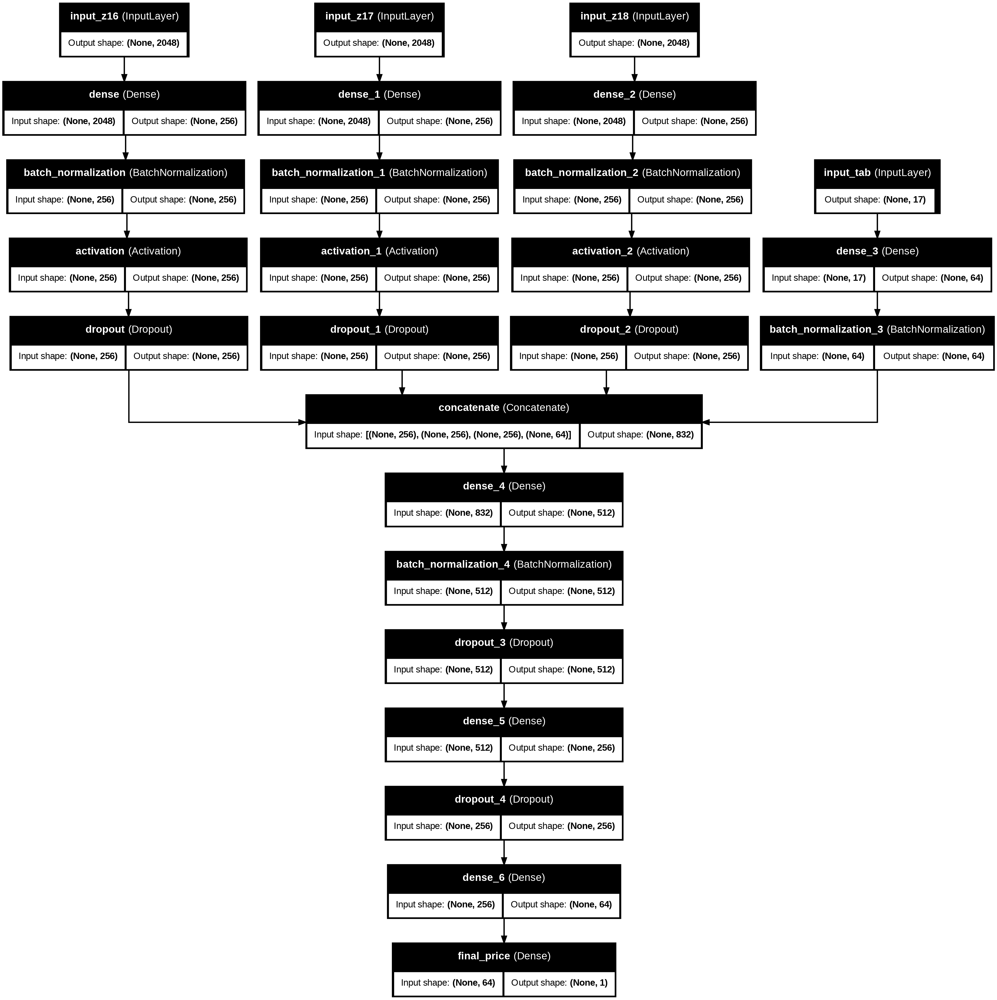

In [ ]:
from keras.utils import plot_model
plot_model(model, show_shapes=True, show_layer_names=True)

In [ ]:
# 1. Save ONLY the best model
checkpoint = callbacks.ModelCheckpoint(
    filepath="best_fusion_model.keras",
    monitor="val_loss",
    save_best_only=True,
    mode="min",
    verbose=1
)

# 2. Stop if it stops learning
early_stop = callbacks.EarlyStopping(
    monitor="val_loss",
    patience=12,           # Wait 12 epochs before quitting
    restore_best_weights=True
)

# 3. Slow down learning rate when stuck
reduce_lr = callbacks.ReduceLROnPlateau(
    monitor="val_loss",
    factor=0.2,            # Reduce speed by 5x
    patience=5,            # If no improvement for 5 epochs
    min_lr=1e-6
)

print("Starting training...")

history = model.fit(
    x=X_train_list,        # Matches the return from load_data
    y=y_train_log,         # Matches your log targets
    validation_data=(X_val_list, y_val_log),
    epochs=100,
    batch_size=32,
    callbacks=[checkpoint, early_stop, reduce_lr],
    verbose=1
)

Starting training...
Epoch 1/100
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 24.9896 - mae: 3.4056
Epoch 1: val_loss improved from inf to 2.43760, saving model to best_fusion_model.keras
406/406 ━━━━━━━━━━━━━━━━━━━━ 19s 34ms/step - loss: 24.9527 - mae: 3.4022 - val_loss: 2.4376 - val_mae: 0.8893 - learning_rate: 5.0000e-04
Epoch 2/100
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 3.4948 - mae: 1.1676
Epoch 2: val_loss did not improve from 2.43760
406/406 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - loss: 3.4932 - mae: 1.1671 - val_loss: 2.5332 - val_mae: 0.9176 - learning_rate: 5.0000e-04
Epoch 3/100
405/406 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step - loss: 2.5480 - mae: 0.9074
Epoch 3: val_loss did not improve from 2.43760
406/406 ━━━━━━━━━━━━━━━━━━━━ 16s 38ms/step - loss: 2.5473 - mae: 0.9072 - val_loss: 3.0953 - val_mae: 1.1315 - learning_rate: 5.0000e-04
Epoch 4/100
406/406 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.0344 - mae: 0.7427
Epoch 4: val_loss improved from 2.43760 to 2.32318, 

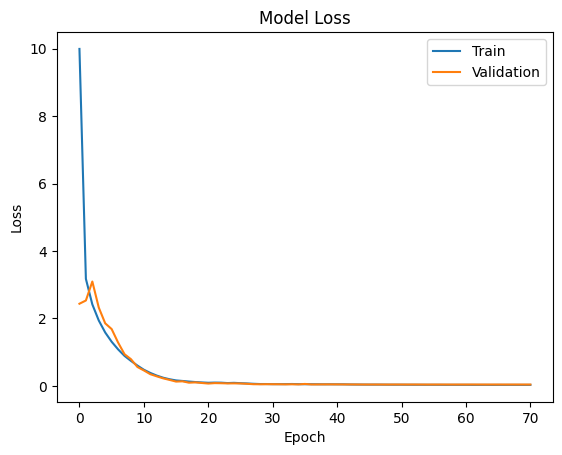

In [ ]:
import matplotlib.pyplot as plt
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper right')

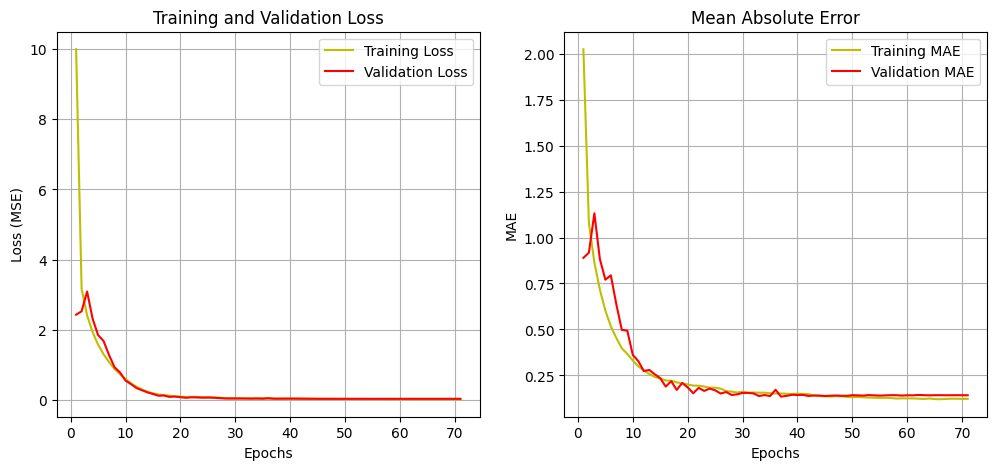

102/102 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


--------------------------------
FINAL RESULTS
R2 Score: 0.8593
MAE:      $77,479.52
RMSE:     $132,897.39
--------------------------------




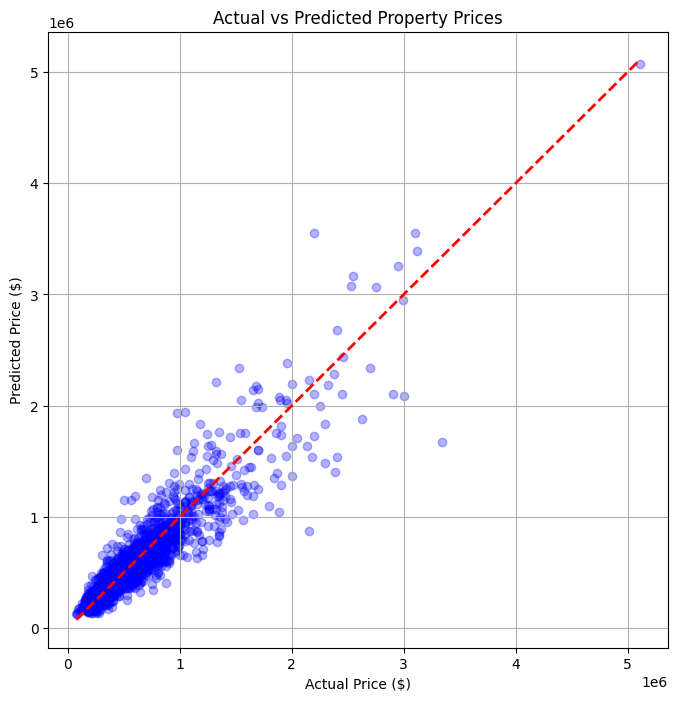

In [ ]:
import matplotlib.pyplot as plt
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error

# --- PART 1: VISUALIZE TRAINING (The Proof) ---
def plot_history(history):
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    epochs = range(1, len(loss) + 1)

    plt.figure(figsize=(12, 5))

    # Plot 1: Loss Curve
    plt.subplot(1, 2, 1)
    plt.plot(epochs, loss, 'y', label='Training Loss')
    plt.plot(epochs, val_loss, 'r', label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss (MSE)')
    plt.legend()
    plt.grid(True)

    # Plot 2: MAE Curve
    mae = history.history['mae']
    val_mae = history.history['val_mae']

    plt.subplot(1, 2, 2)
    plt.plot(epochs, mae, 'y', label='Training MAE')
    plt.plot(epochs, val_mae, 'r', label='Validation MAE')
    plt.title('Mean Absolute Error')
    plt.xlabel('Epochs')
    plt.ylabel('MAE')
    plt.legend()
    plt.grid(True)

    plt.show()

plot_history(history)


# --- PART 2: EVALUATE BEST MODEL (CORRECTED FOR LOG1P) ---
best_model = models.load_model("best_fusion_model.keras")

# Predicting on Validation Set
preds_log = best_model.predict(X_val_list)

# 1. Reverse the Log1p Transformation
# We use expm1 because you used log1p originally
preds_real = np.expm1(preds_log)
y_val_real = np.expm1(y_val_log)

# 2. Calculate Scores
r2 = r2_score(y_val_real, preds_real)
mae = mean_absolute_error(y_val_real, preds_real)
rmse = np.sqrt(mean_squared_error(y_val_real, preds_real))

print('\n\n--------------------------------')
print(f"FINAL RESULTS")
print(f"R2 Score: {r2:.4f}")
print(f"MAE:      ${mae:,.2f}")
print(f"RMSE:     ${rmse:,.2f}")
print('--------------------------------\n\n')


# --- PART 3: VISUALIZE PREDICTIONS ---
plt.figure(figsize=(8, 8))
plt.scatter(y_val_real, preds_real, alpha=0.3, color='blue')
plt.plot([y_val_real.min(), y_val_real.max()], [y_val_real.min(), y_val_real.max()], 'r--', lw=2)
plt.xlabel('Actual Price ($)')
plt.ylabel('Predicted Price ($)')
plt.title('Actual vs Predicted Property Prices')
plt.grid(True)
plt.show()

In [ ]:
model.save("/content/drive/MyDrive/Satellite_Property_Valuation/saved_models/best_fusion_model.keras")

# GRAD-CAM

In [ ]:
import tensorflow as tf
from tensorflow.keras.models import Model
import numpy as np
import cv2
import matplotlib.pyplot as plt

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input


In [ ]:
resnet = ResNet50(
    weights="imagenet",
    include_top=True   # IMPORTANT for Grad-CAM
)


In [ ]:
def load_image(img_path):
    img = cv2.imread(img_path)

    if img is None:
        raise FileNotFoundError(f"Image not found at {img_path}")

    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (224, 224))

    img_array = np.expand_dims(img.astype(np.float32), axis=0)
    img_array = preprocess_input(img_array)

    return img, img_array


In [ ]:
def compute_gradcam(model, img_array, layer_name="conv5_block3_out"):
    # Model that gives conv output + prediction
    grad_model = tf.keras.models.Model(
        [model.input],
        [model.get_layer(layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(img_array)
        class_idx = tf.argmax(predictions[0])
        loss = predictions[:, class_idx]

    # Gradients of class wrt conv layer
    grads = tape.gradient(loss, conv_outputs)

    # Global average pooling on gradients
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    # Weight the feature maps
    conv_outputs = conv_outputs[0]
    heatmap = tf.reduce_sum(conv_outputs * pooled_grads, axis=-1)

    # ReLU + normalize
    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap) + 1e-8

    return heatmap


In [ ]:
def overlay_gradcam(img, heatmap, alpha=0.4):
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)

    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    superimposed = cv2.addWeighted(img, 1 - alpha, heatmap, alpha, 0)

    return superimposed


In [ ]:
# enter the image index and zoom :
img_idx = 109
zoom = 18
img_path = f"/content/drive/MyDrive/Satellite_Property_Valuation/train_images/{img_idx}_z{zoom}.png"

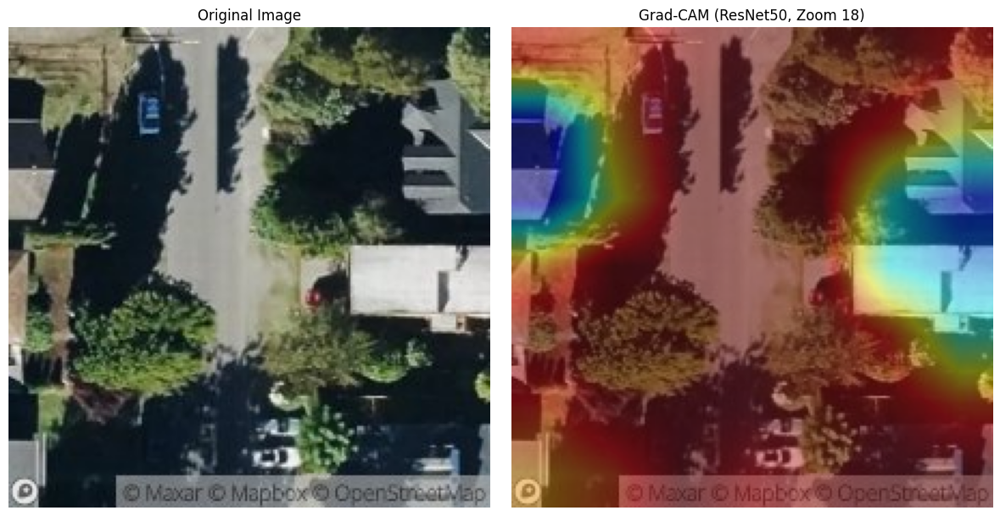

In [ ]:
import matplotlib.pyplot as plt

# Load image and compute
orig_img, img_array = load_image(img_path)
heatmap = compute_gradcam(resnet, img_array)
gradcam_img = overlay_gradcam(orig_img, heatmap)

fig, axes = plt.subplots(1, 2, figsize=(12, 6))

# Left Side: Original Image
axes[0].imshow(orig_img)
axes[0].set_title("Original Image")
axes[0].axis("off")

# Right Side: Grad-CAM Result
axes[1].imshow(gradcam_img)
axes[1].set_title(f"Grad-CAM (ResNet50, Zoom {zoom})")
axes[1].axis("off")


plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import os

# function to show grad-cam for an image for a particular zoom
def show_gradcam(img_idx, zoom, model, base_path="/content/drive/MyDrive/Satellite_Property_Valuation/train_images"):

    # path
    img_path = f"{base_path}/{img_idx}_z{zoom}.png"

    # Check if file exists
    if not os.path.exists(img_path):
        print(f"Error: Image not found at {img_path}")
        return

    # Compute Grad-CAM
    orig_img, img_array = load_image(img_path)
    heatmap = compute_gradcam(model, img_array)
    gradcam_img = overlay_gradcam(orig_img, heatmap)

    # Plotting
    fig, axes = plt.subplots(1, 2, figsize=(12, 6))

    # Left: Original
    axes[0].imshow(orig_img)
    axes[0].set_title(f"Original: {img_idx} (Zoom {zoom})")
    axes[0].axis("off")

    # Right: Grad-CAM
    axes[1].imshow(gradcam_img)
    axes[1].set_title(f"Grad-CAM Prediction")
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

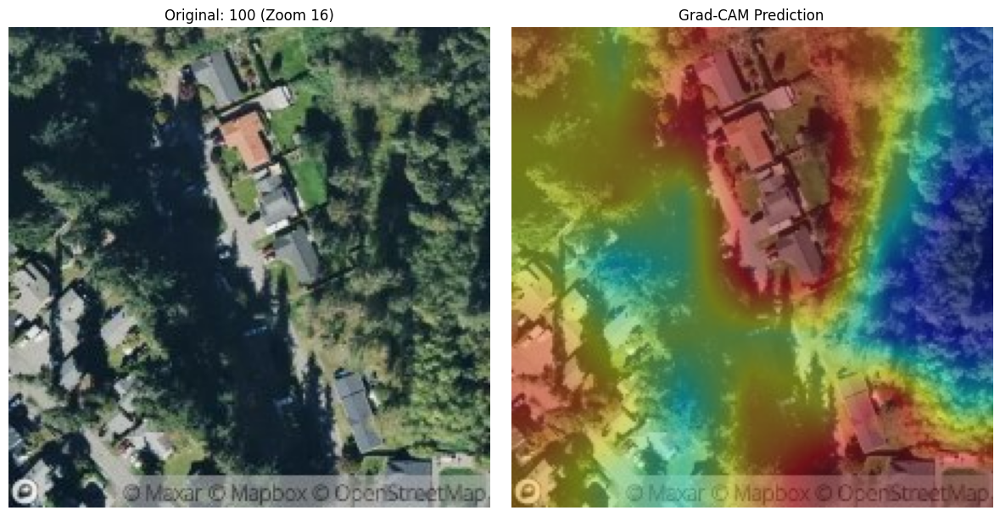

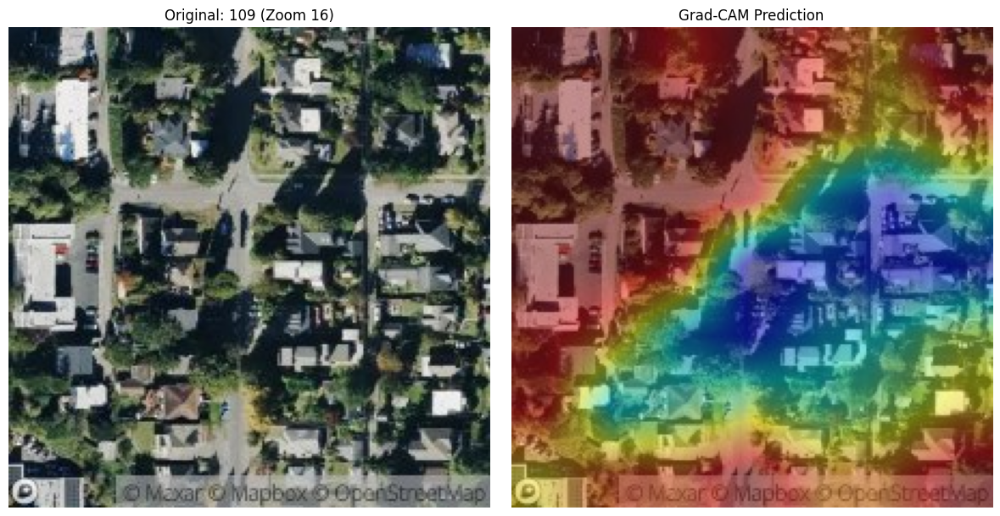

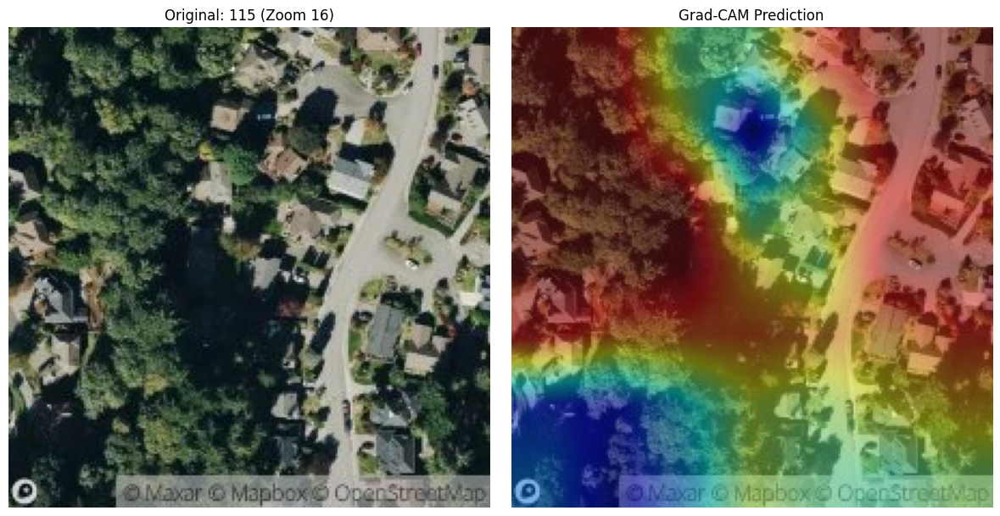

In [ ]:
# for zoom 16
test_ids = [100, 109, 115]

for i in test_ids:
    show_gradcam(img_idx=i, zoom=16, model=resnet)

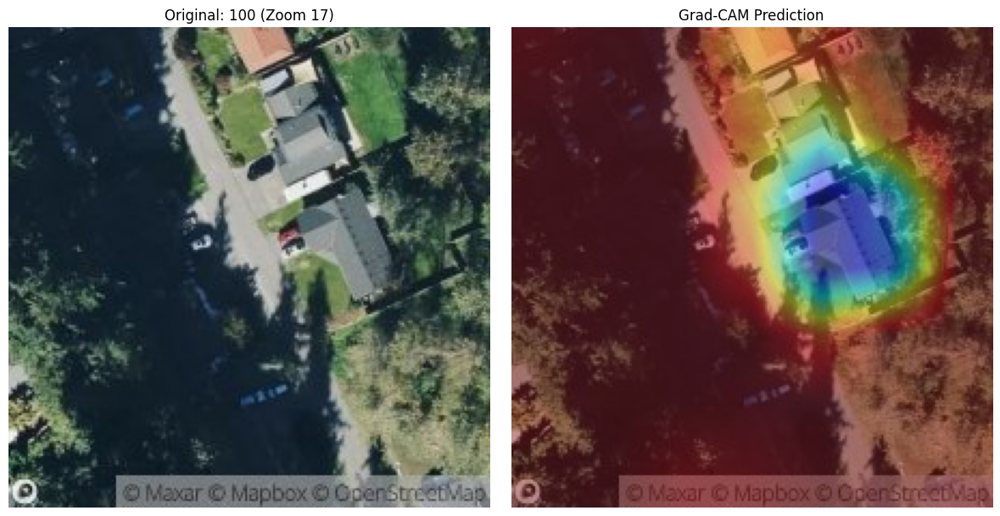

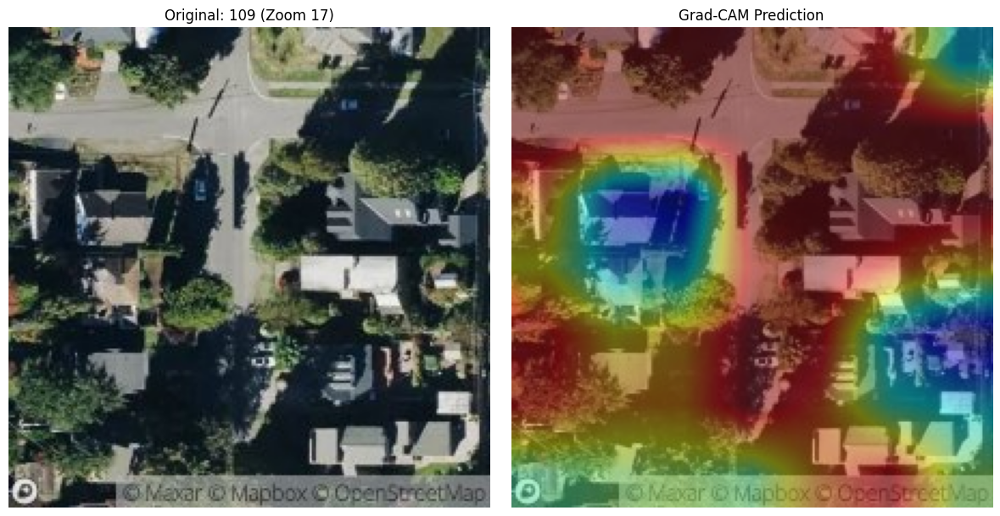

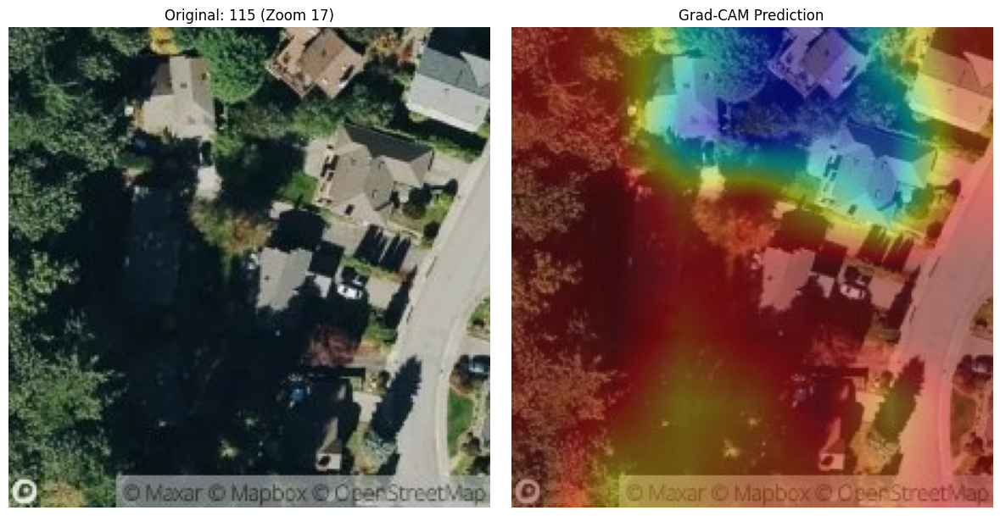

In [ ]:
# for zoom 17
test_ids = [100, 109, 115]

for i in test_ids:
    show_gradcam(img_idx=i, zoom=17, model=resnet)

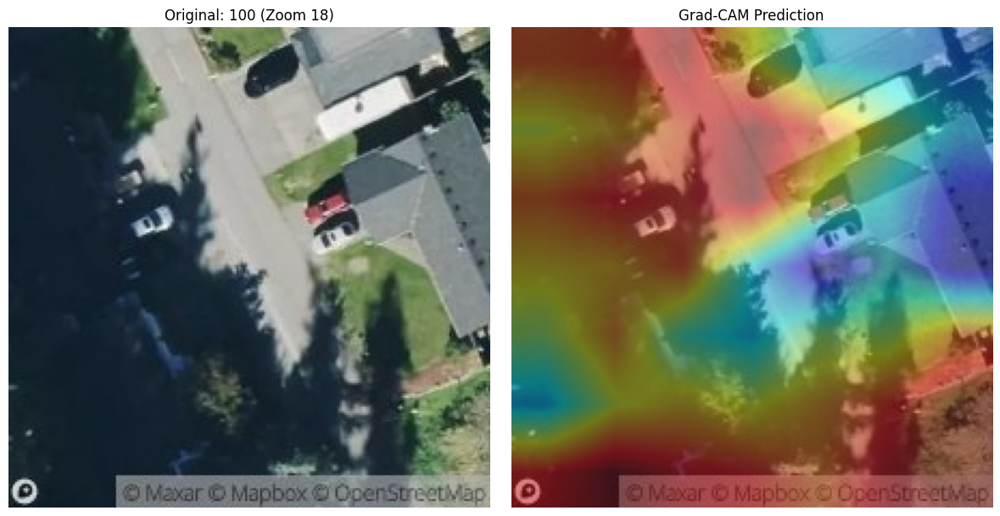

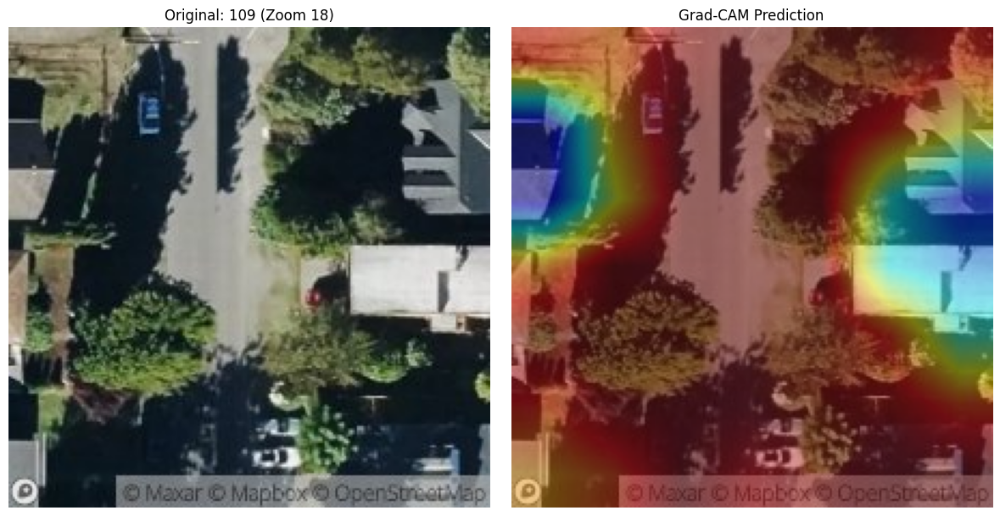

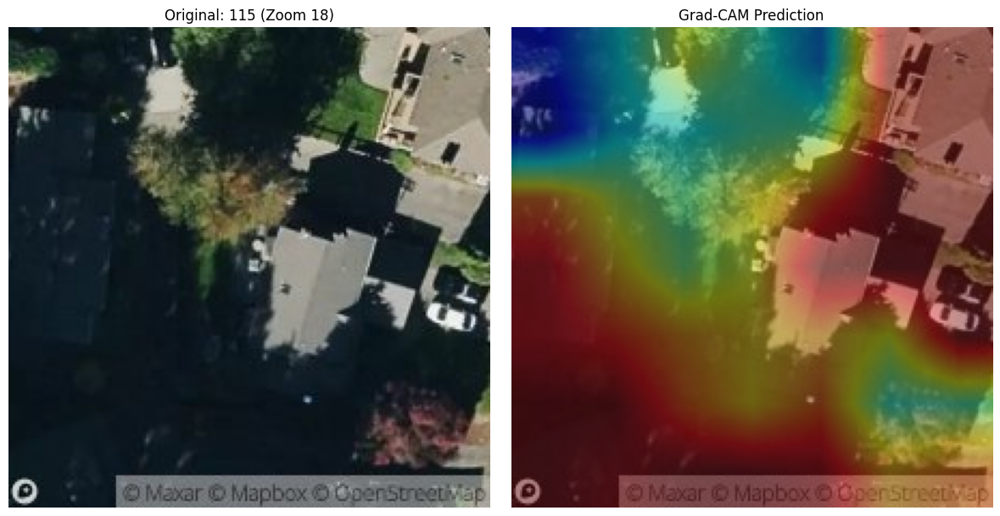

In [ ]:
# for zoom 18
test_ids = [100, 109, 115]

for i in test_ids:
    show_gradcam(img_idx=i, zoom=18, model=resnet)

# Predicting Price of Test Dataset

In [ ]:
import pandas as pd
df_test = pd.read_csv("/content/drive/MyDrive/Satellite_Property_Valuation/data/test2(test(1)).csv")

df_test.head()

,id,date,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,2591820310,20141006T000000,4,2.25,2070,8893,2.0,0,0,4,8,2070,0,1986,0,98058,47.4388,-122.162,2390,7700
1,7974200820,20140821T000000,5,3.00,2900,6730,1.0,0,0,5,8,1830,1070,1977,0,98115,47.6784,-122.285,2370,6283
2,7701450110,20140815T000000,4,2.50,3770,10893,2.0,0,2,3,11,3770,0,1997,0,98006,47.5646,-122.129,3710,9685
3,9522300010,20150331T000000,3,3.50,4560,14608,2.0,0,2,3,12,4560,0,1990,0,98034,47.6995,-122.228,4050,14226
4,9510861140,20140714T000000,3,2.50,2550,5376,2.0,0,0,3,9,2550,0,2004,0,98052,47.6647,-122.083,2250,4050


In [ ]:
import numpy as np

# importing scaled tabular features of Test dataset we did in preprocessing and feature engineering
path = '/content/drive/MyDrive/Satellite_Property_Valuation/X_tab_test_scaled/X_tab_test_scaled.npy'

X_test_loaded = np.load(path)

print("Features Loaded Successfully!")
print("Shape:", X_test_loaded.shape)  # E.g., (1000, 50) aana chahiye

Features Loaded Successfully!
Shape: (5404, 17)


In [ ]:
predicted_log_price = best_cat.predict(X_test_loaded)
predicted_log_price

array([12.85156018, 13.70397123, 13.95555956, ..., 12.53234734,
       14.49604797, 12.69148726])

In [ ]:
predicted_log_price.shape

(5404,)

In [ ]:
predicted_price = np.expm1(predicted_log_price)
predicted_price


array([ 381382.29799796,  894455.21388078, 1150329.16460394, ...,
        277158.1964596 , 1974937.79861656,  324968.71017876])

In [ ]:
predicted_price_df = pd.DataFrame(predicted_price, columns=['price'])
predicted_price_df

,price
0,3.813823e+05
1,8.944552e+05
2,1.150329e+06
3,1.762481e+06
4,7.376270e+05
...,...
5399,6.802087e+05
5400,6.449751e+05
5401,2.771582e+05
5402,1.974938e+06


In [ ]:
final_df_test_price = pd.concat([df_test["id"], predicted_price_df], axis=1)
final_df_test_price

,id,price
0,2591820310,3.813823e+05
1,7974200820,8.944552e+05
2,7701450110,1.150329e+06
3,9522300010,1.762481e+06
4,9510861140,7.376270e+05
...,...,...
5399,7732500270,6.802087e+05
5400,3856903515,6.449751e+05
5401,2557000400,2.771582e+05
5402,4386700135,1.974938e+06


In [ ]:
import os

output_folder = "/content/drive/MyDrive/Satellite_Property_Valuation/Result"
os.makedirs(output_folder, exist_ok=True)

save_path = f"{output_folder}/final_df_test_price.csv"

final_df_test_price.to_csv(save_path, index=False)

print(f"File saved successfully at: {save_path}")

File saved successfully at: /content/drive/MyDrive/Satellite_Property_Valuation/Result/final_df_test_price.csv
